### I/O: Batch Load Text Files

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



<Figure size 640x480 with 0 Axes>

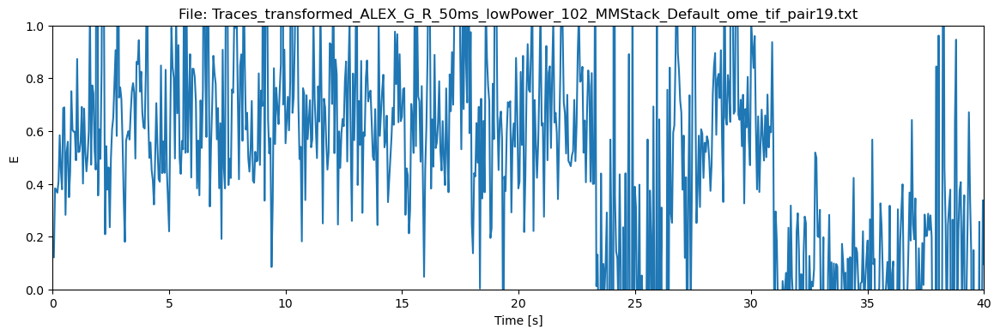

<Figure size 640x480 with 0 Axes>

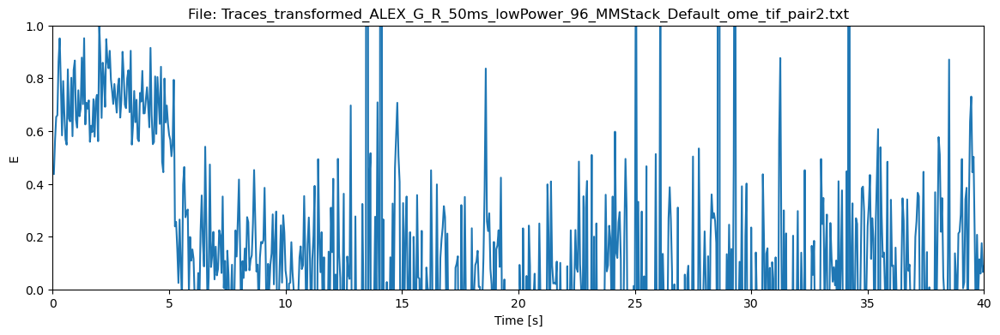

<Figure size 640x480 with 0 Axes>

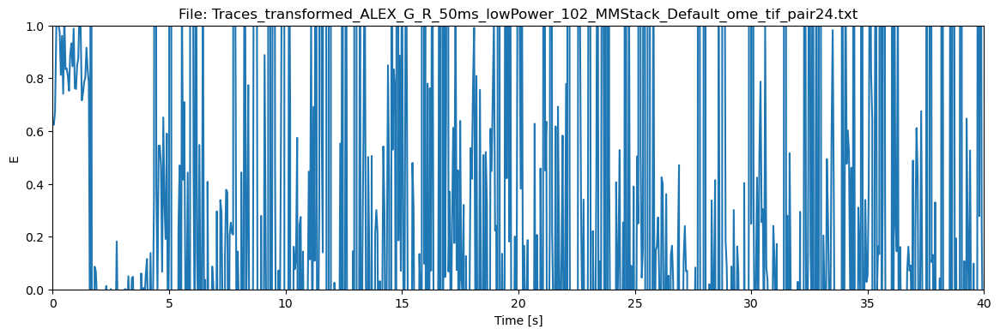

<Figure size 640x480 with 0 Axes>

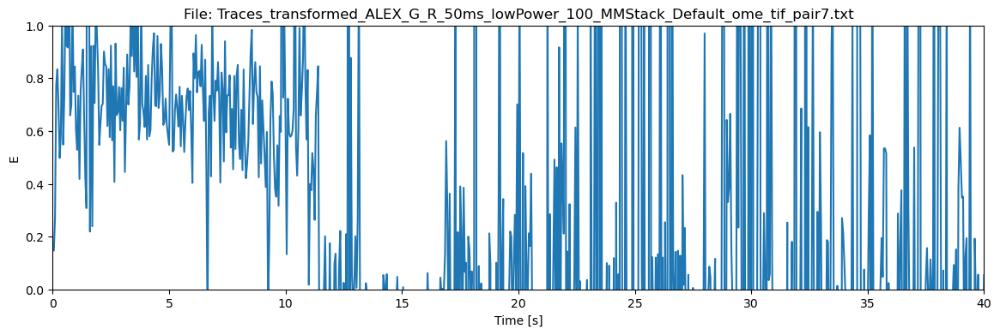

<Figure size 640x480 with 0 Axes>

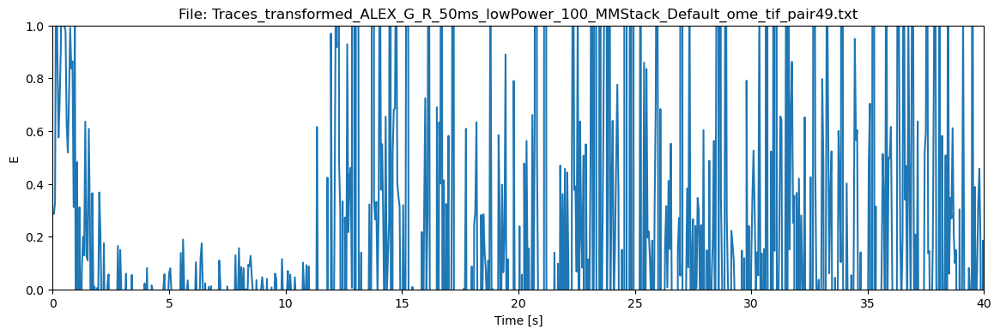

<Figure size 640x480 with 0 Axes>

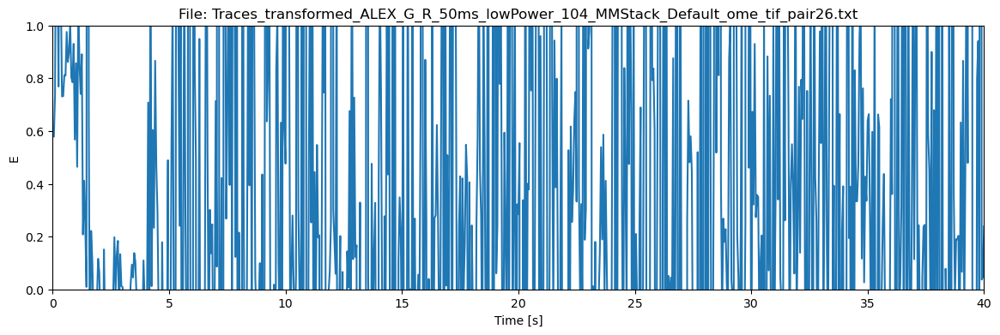

<Figure size 640x480 with 0 Axes>

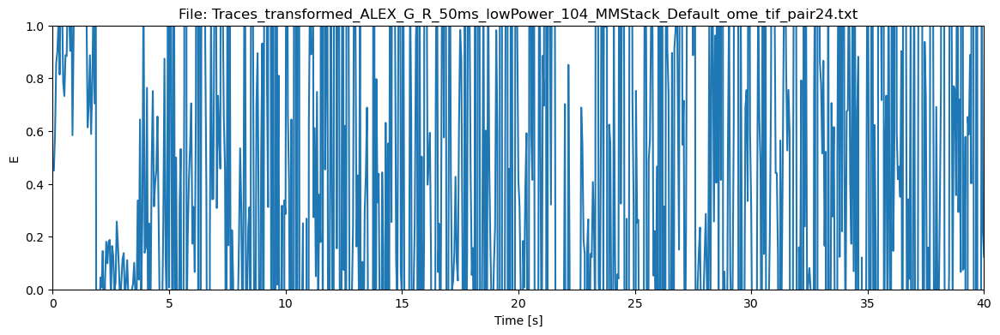

<Figure size 640x480 with 0 Axes>

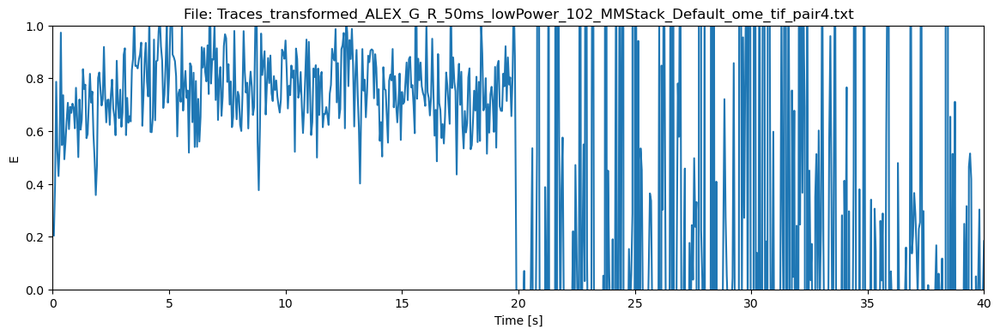

<Figure size 640x480 with 0 Axes>

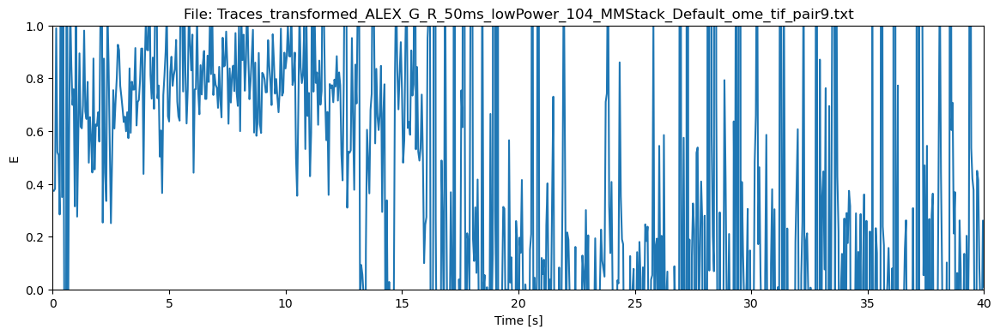

<Figure size 640x480 with 0 Axes>

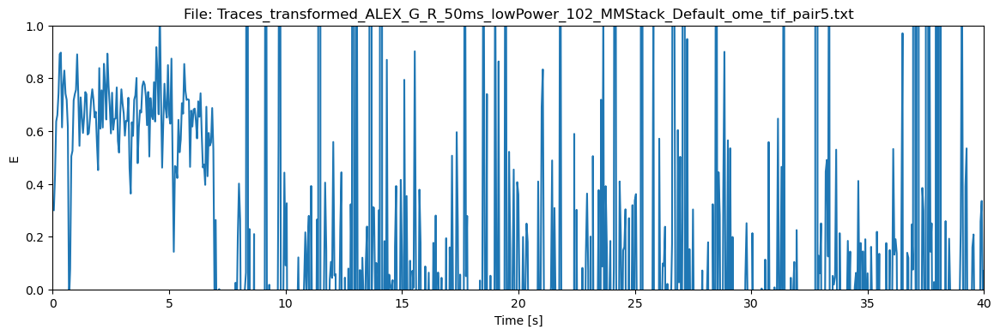

<Figure size 640x480 with 0 Axes>

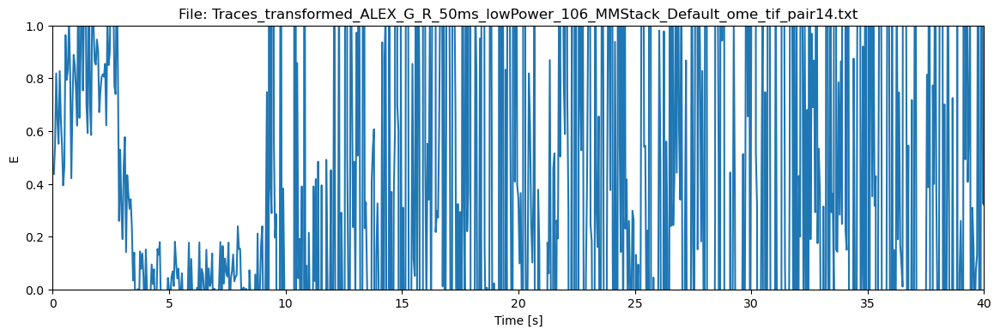

<Figure size 640x480 with 0 Axes>

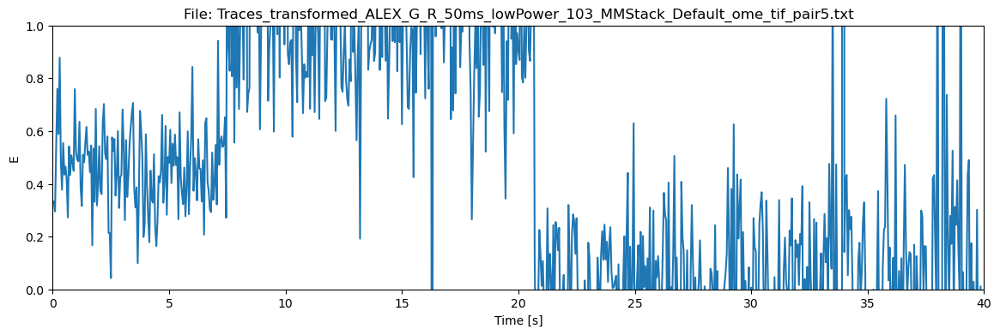

<Figure size 640x480 with 0 Axes>

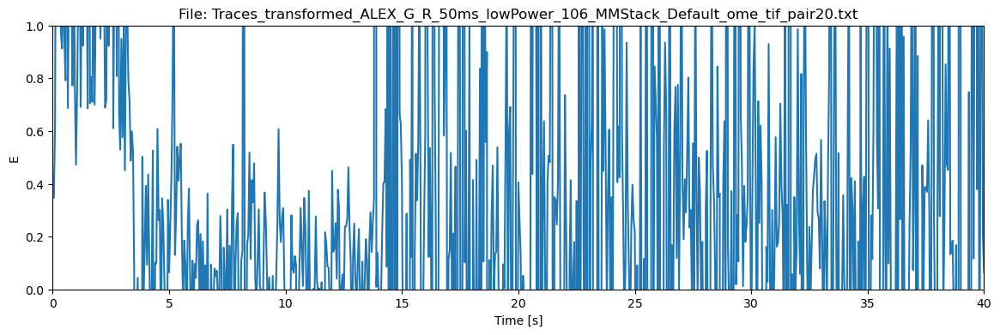

<Figure size 640x480 with 0 Axes>

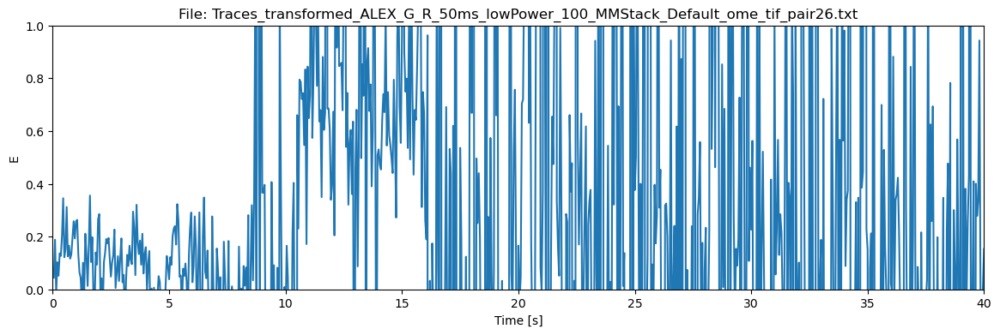

<Figure size 640x480 with 0 Axes>

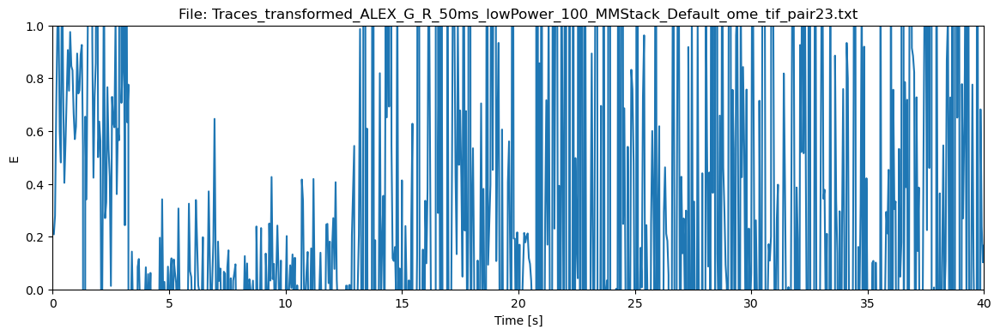

<Figure size 640x480 with 0 Axes>

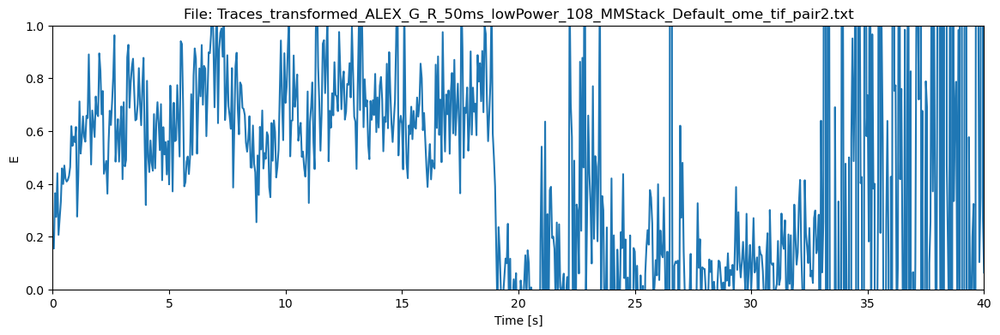

<Figure size 640x480 with 0 Axes>

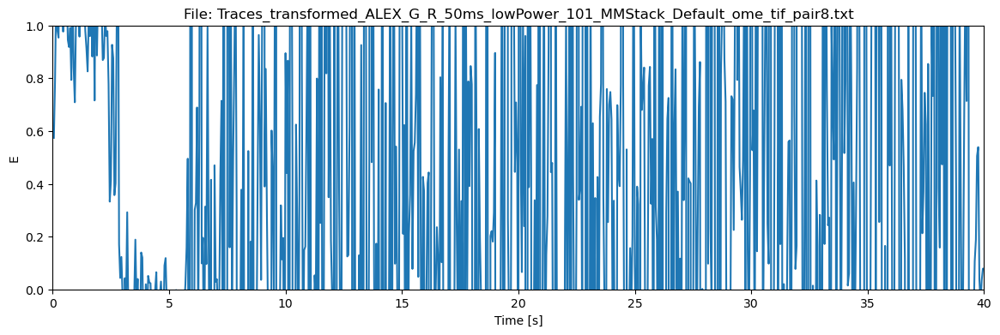

<Figure size 640x480 with 0 Axes>

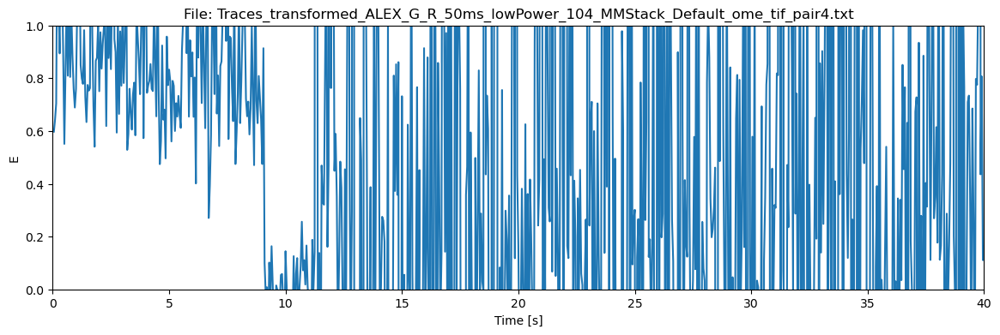

<Figure size 640x480 with 0 Axes>

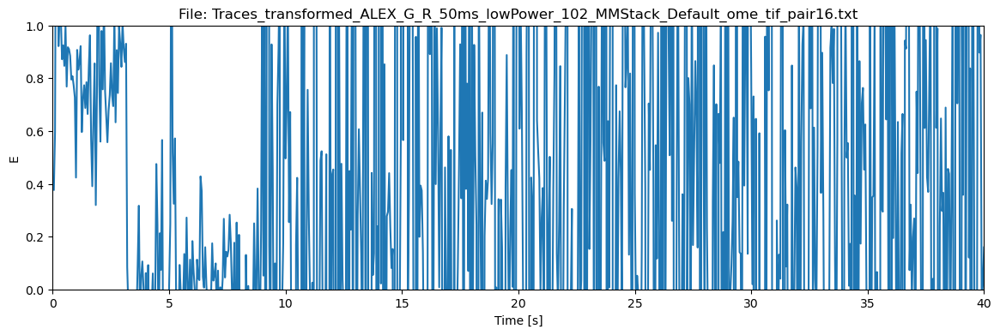

<Figure size 640x480 with 0 Axes>

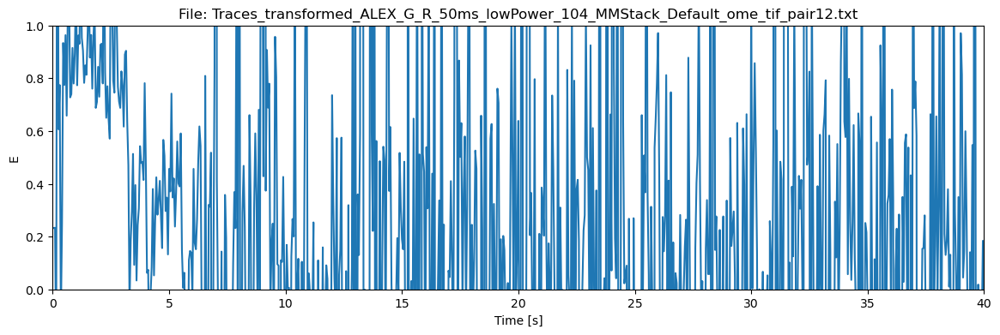

<Figure size 640x480 with 0 Axes>

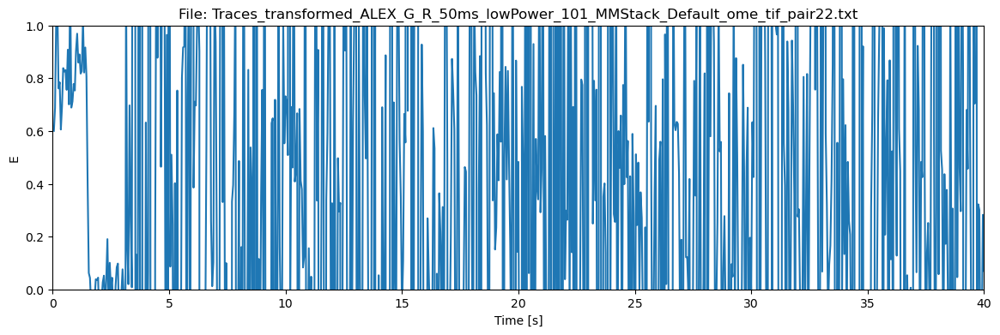

<Figure size 640x480 with 0 Axes>

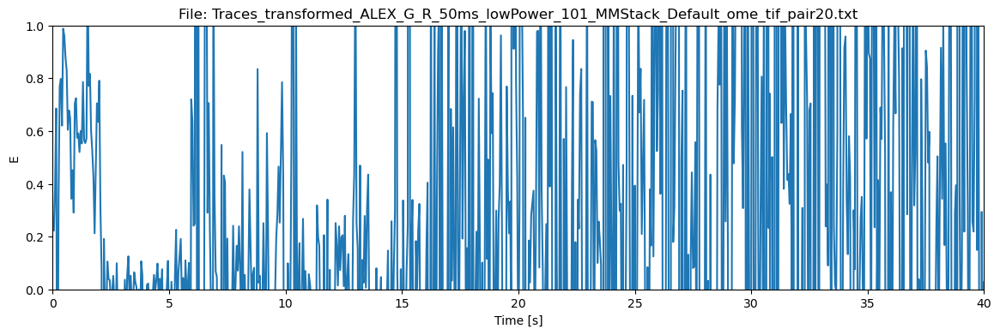

<Figure size 640x480 with 0 Axes>

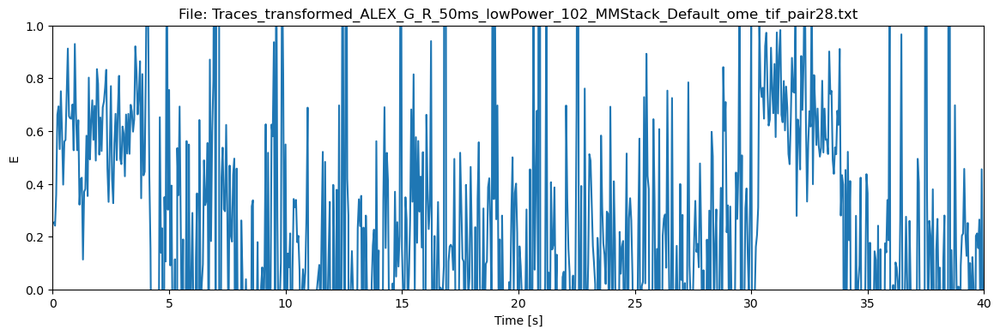

In [1]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
# 🔧 USER INPUT REQUIRED below — review and edit these assignments if needed:
#   input_directory = 'SRP_proximal_length/147_M/FRET'
# Fit HMM / decode hidden states; check n_components and convergence params
#   output_directory = 'SRP_proximal_length/147_M/HMM_FRET'

import numpy as np
import matplotlib.pyplot as plt
import glob
# Fit HMM / decode hidden states; check n_components and convergence params
from hmmlearn import hmm
import os  # You need to import the 'os' module to extract filenames

# Define input and output directories
input_directory = 'SRP/Example'
# Fit HMM / decode hidden states; check n_components and convergence params
output_directory = 'SRP/Example/HMM_FRET'

# Ensure output directory exists, if not create it
os.makedirs(output_directory, exist_ok=True)

%matplotlib inline

# Defining file names and initializing an empty list:
# List files on disk for batch processing
fnames = glob.glob(os.path.join(input_directory, '*.txt'))
data_list = []

# Looping over the file names and loading the data:
for filename in fnames:
# Load tabular data from text/CSV — ensure delimiter matches your files
    data = np.loadtxt(filename, skiprows=1)
    data_list.append(data)

# Plotting the data:
for i, data in enumerate(data_list):
# Plotting with Matplotlib — labels and titles improve readability
    plt.clf()  # Remove existing plots
    
    # Plot the data and print the filename
    # Plotting with Matplotlib — labels and titles improve readability
    fig, ax = plt.subplots(figsize=(14, 4))
    
    # Use the values from the fourth column (T column) as the x-axis
    x_values = data[:, 3]
    
    # Plot E (3rd column) vs T (4th column)
    ax.plot(x_values, data[:, 2], label='E')  
    
    # Set x-axis label as "Time [s]"
    ax.set_xlabel("Time [s]")
    
    # Set y-axis label as "Intensity" for the top subplot
    ax.set_ylabel("E")
    
    # Set y-axis limits to [0, 1]
    ax.set_ylim(0, 1)
    ax.set_xlim(0, 40)
    
    # Extract the filename without the path
    filename_without_path = os.path.basename(fnames[i])
    
    # Set a title with the filename
# Plotting with Matplotlib — labels and titles improve readability
    plt.title(f'File: {filename_without_path}')
    
    # Display the plot
    # Plotting with Matplotlib — labels and titles improve readability
    plt.show()

### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [2]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
# (No obvious user-editable parameters detected in this cell.)

import numpy as np
import glob

# Defining file names and initializing an empty list:
# List files on disk for batch processing
fnames = glob.glob(os.path.join(input_directory, '*.txt'))
combined_data = []

# Looping over the file names and loading the data:
for idx, filename in enumerate(fnames):
# Load tabular data from text/CSV — ensure delimiter matches your files
    data = np.loadtxt(filename, skiprows=1, max_rows=800)
    
    # Keep only the third and fourth columns, and rename them
    processed_data = data[:, 2:4]
    processed_data = np.column_stack((processed_data[:, 0], processed_data[:, 1]))
    
    # Add a new column with a sequential number for each file
    file_number = idx + 1
    file_indicator = np.full((processed_data.shape[0], 1), file_number)
    
    # Combine the processed data, the file indicator column, and set decimal format
    processed_data_with_indicator = np.column_stack((processed_data, file_indicator))
    
    combined_data.append(processed_data_with_indicator)

# Convert the list to a NumPy array
combined_data = np.concatenate(combined_data)

# Truncate all values to two decimal places for the first two columns, none for the third column
truncated_data = np.zeros_like(combined_data)
truncated_data[:, :2] = np.trunc(combined_data[:, :2] * 100) / 100
truncated_data[:, 2] = combined_data[:, 2]

# Update values in the T column to start from 1 and increase by 1 in each consecutive row
truncated_data[:, 1] = np.arange(1, truncated_data.shape[0] + 1)

# Save the truncated and processed data to a new text file without a comment line
output_file = os.path.join(output_directory, 'combined_data_final_with_indicator.txt')
np.savetxt(output_file, truncated_data, fmt=['%.2f', '%.0f', '%.0f'], header='E T Indicator', comments='')

print("Data from all files combined, processed, truncated, with indicator as the third column (numbering files sequentially), and saved to combined_data_final_with_indicator.txt.")

Data from all files combined, processed, truncated, with indicator as the third column (numbering files sequentially), and saved to combined_data_final_with_indicator.txt.


### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



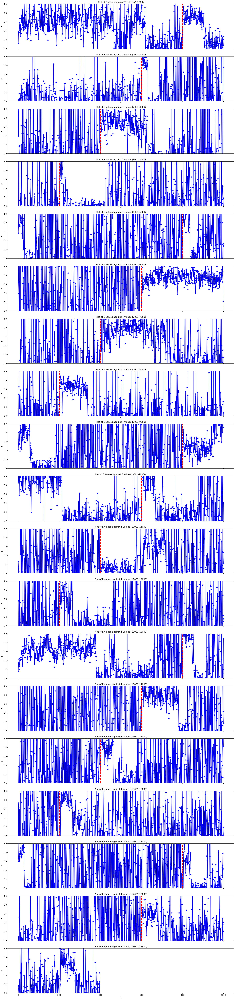

In [3]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_final_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E, T, and Indicator columns
E_values = combined_data[:, 0]
T_values = combined_data[:, 1]
Indicator_values = combined_data[:, 2]

# Set the number of points per plot
points_per_plot = 1000

# Calculate the number of plots needed
num_plots = int(np.ceil(len(T_values) / points_per_plot))

# Set the figure width to be wider
# Plotting with Matplotlib — labels and titles improve readability
fig, axes = plt.subplots(num_plots, 1, figsize=(18, 4 * num_plots), sharex=True)

# Plot E values (Y axis) against T values (X axis) for each plot
for i in range(num_plots):
    start_idx = i * points_per_plot
    end_idx = min((i + 1) * points_per_plot, len(T_values))
    
    # Plot only the relevant range of T values
    axes[i].plot(np.arange(1, end_idx - start_idx + 1), E_values[start_idx:end_idx], marker='o', linestyle='-', color='b')
    
    # Add red vertical lines where a new number first appears in Indicator column
    unique_indicator_values, unique_indicator_indices = np.unique(Indicator_values[start_idx:end_idx], return_index=True)
    for idx in unique_indicator_indices[1:]:  # Skip the first index (0) as it's the starting point
        axes[i].axvline(x=idx + 1, color='r', linestyle='--', linewidth=3)
    
    # Set labels and title for each plot
    axes[i].set_xlabel('T')
    axes[i].set_ylabel('E')
    axes[i].set_title(f'Plot of E values against T values ({start_idx+1}-{end_idx})')
    
    # Set y-axis limits to [0, 1]
    axes[i].set_ylim(0, 1)

# Adjust layout to prevent overlapping of titles
# Plotting with Matplotlib — labels and titles improve readability
plt.tight_layout()

# Show the plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [4]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.


import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_final_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E and Indicator columns
E_values = combined_data[:, 0]
Indicator_values = combined_data[:, 2]

# Set the threshold for consecutive occurrences below 0 or above 1
threshold_count = 5

# Set the window size for searching through consecutive 25 rows
window_size = 20

# Initialize a mask to keep track of valid rows
valid_mask = np.ones(len(E_values), dtype=bool)

# Search through each consecutive 25 rows of the E column
for i in range(len(E_values) - window_size + 1):
    window_E = E_values[i:i+window_size]
    
    # Check if there are at least 'threshold_count' occurrences below 0 or above 1
    if np.sum((window_E < -0.2) | (window_E > 1.2)) >= threshold_count:
        valid_mask[i:i+window_size] = False

# Keep only the rows where the values are valid
filtered_data = combined_data[valid_mask]

# Save the truncated and processed data to a new text file without a comment line
output_file = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')
np.savetxt(output_file, filtered_data, fmt=['%.2f', '%.0f', '%.0f'], header='E T I', comments='')

print("Filtered data saved to combined_data_filtered_with_indicator.txt.")

Filtered data saved to combined_data_filtered_with_indicator.txt.


### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



Total number of points: 4128


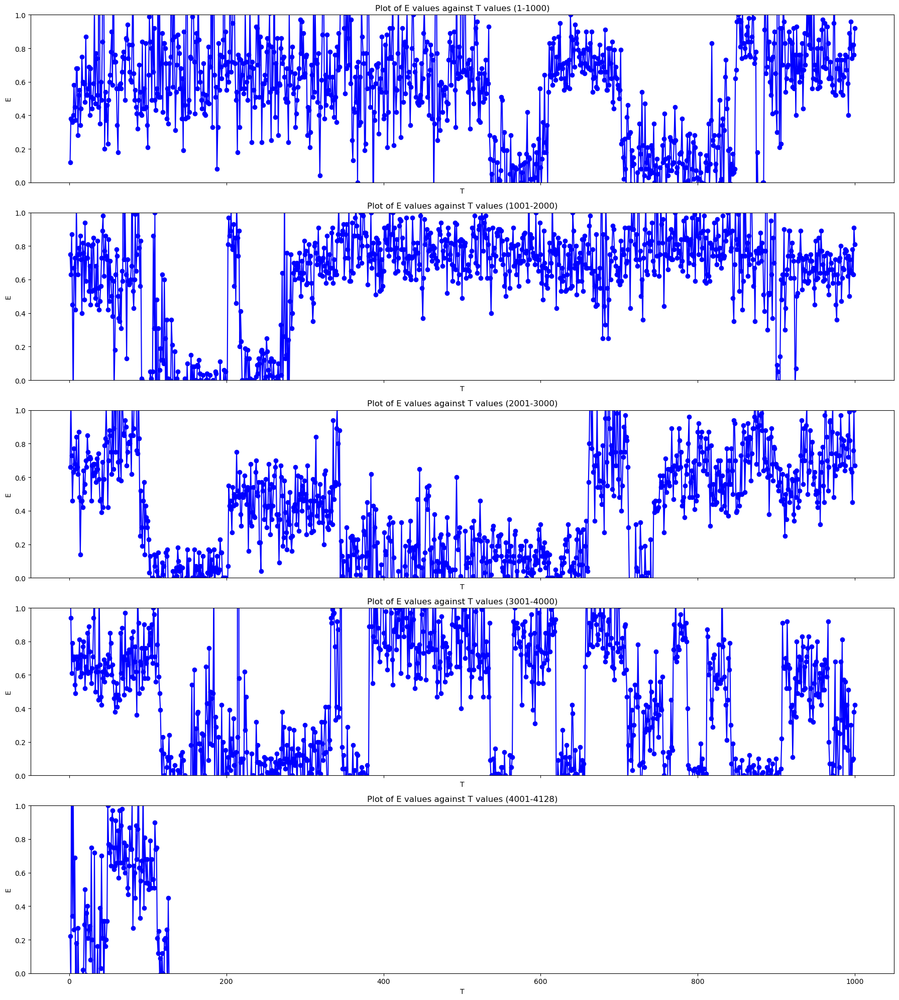

In [5]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E and T columns
E_values = combined_data[:, 0]
T_values = combined_data[:, 1]

# Calculate the total number of points
total_points = len(T_values)

# Set the number of points per plot
points_per_plot = 1000

# Calculate the number of plots needed
num_plots = int(np.ceil(total_points / points_per_plot))

# Print the total number of points
print("Total number of points:", total_points)

# Set the figure width to be wider
# Plotting with Matplotlib — labels and titles improve readability
fig, axes = plt.subplots(num_plots, 1, figsize=(18, 4 * num_plots), sharex=True)

# Plot E values (Y axis) against T values (X axis) for each plot
for i in range(num_plots):
    start_idx = i * points_per_plot
    end_idx = min((i + 1) * points_per_plot, total_points)
    
    # Plot only the relevant range of T values
    axes[i].plot(np.arange(1, end_idx - start_idx + 1), E_values[start_idx:end_idx], marker='o', linestyle='-', color='b')
    
    # Set labels and title for each plot
    axes[i].set_xlabel('T')
    axes[i].set_ylabel('E')
    axes[i].set_title(f'Plot of E values against T values ({start_idx+1}-{end_idx})')
    
    # Set y-axis limits to [0, 1]
    axes[i].set_ylim(0, 1)

# Adjust layout to prevent overlapping of titles
# Plotting with Matplotlib — labels and titles improve readability
plt.tight_layout()

# Show the plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



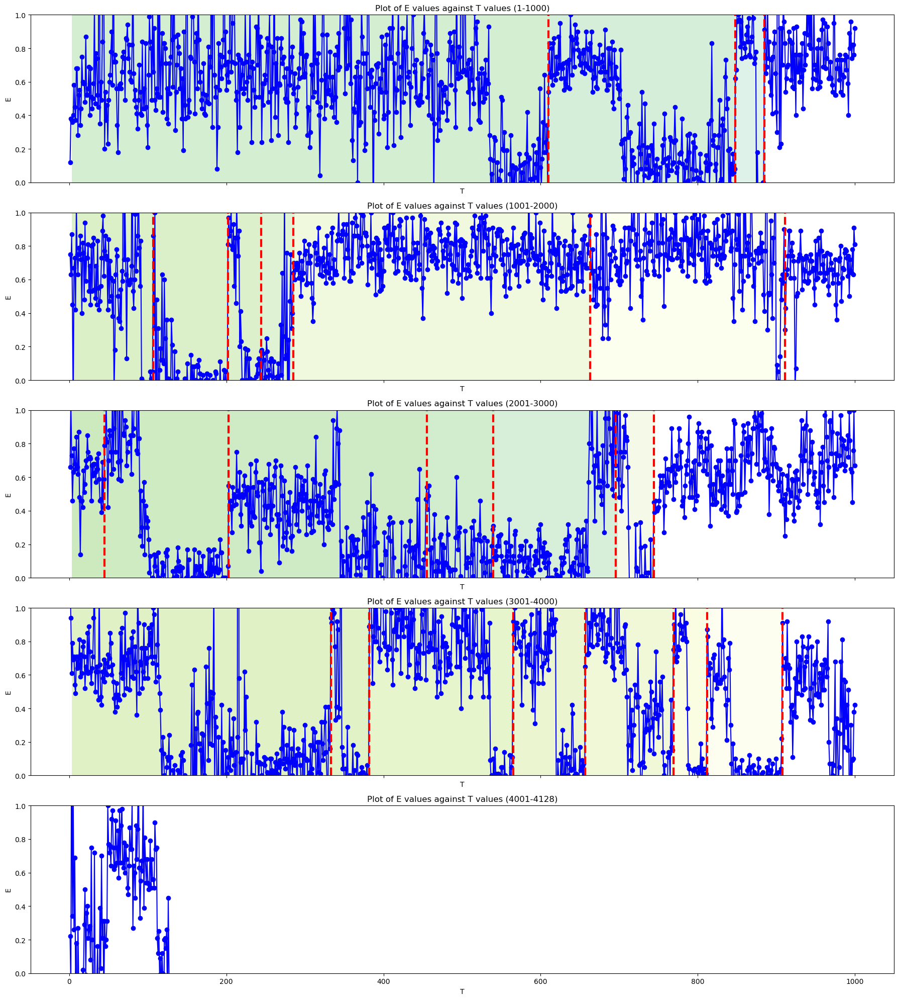

In [6]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import YlGnBu
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E, T, and Indicator columns
E_values = combined_data[:, 0]
T_values = combined_data[:, 1]
Indicator_values = combined_data[:, 2]

# Set the number of points per plot
points_per_plot = 1000

# Calculate the number of plots needed
num_plots = int(np.ceil(len(T_values) / points_per_plot))

# Set the figure width to be wider
# Plotting with Matplotlib — labels and titles improve readability
fig, axes = plt.subplots(num_plots, 1, figsize=(18, 4 * num_plots), sharex=True)

# Use the Viridis colormap
cmap = YlGnBu

# Plot E values (Y axis) against T values (X axis) for each plot
for i in range(num_plots):
    start_idx = i * points_per_plot
    end_idx = min((i + 1) * points_per_plot, len(T_values))
    
    # Plot only the relevant range of T values
    axes[i].plot(np.arange(1, end_idx - start_idx + 1), E_values[start_idx:end_idx], marker='o', linestyle='-', color='b')
    
    # Add red vertical lines where a new number first appears in Indicator column
    unique_indicator_values, unique_indicator_indices = np.unique(Indicator_values[start_idx:end_idx], return_index=True)
    for idx in unique_indicator_indices[1:]:  # Skip the first index (0) as it's the starting point
        axes[i].axvline(x=idx + 1, color='r', linestyle='--', linewidth=3)
        
        # Color the background differently for each surface separated by the line
        axes[i].axvspan(unique_indicator_indices[0] + 3, idx + 3, facecolor=cmap((idx + 3) % 100), alpha=0.3)

    # Set labels and title for each plot
    axes[i].set_xlabel('T')
    axes[i].set_ylabel('E')
    axes[i].set_title(f'Plot of E values against T values ({start_idx+1}-{end_idx})')
    
    # Set y-axis limits to [0, 1]
    axes[i].set_ylim(0, 1)

# Adjust layout to prevent overlapping of titles
# Plotting with Matplotlib — labels and titles improve readability
plt.tight_layout()

# Show the plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



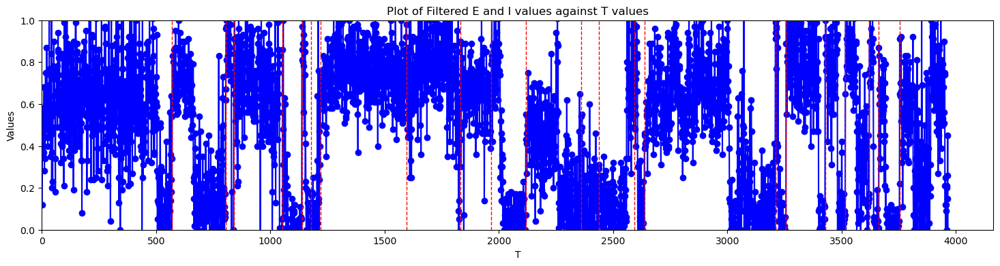

In [7]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E, T, and I columns
E_values = combined_data[:, 0]
I_values = combined_data[:, 2]  # Assuming I column is the third column (index 2)

# Filter E values between 0.2 and 1.2
filtered_indices = np.where((E_values >= -0.2) & (E_values <= 1.2))
E_values_filtered = E_values[filtered_indices]
I_values_filtered = I_values[filtered_indices]

# Replace existing T values with a new sequence starting from 1
T_values = np.arange(1, len(E_values_filtered) + 1)

# Save the modified data to a new text file
modified_data = np.column_stack((E_values_filtered, T_values, I_values_filtered))

# Save the truncated and processed data to a new text file without a comment line
output_file = os.path.join(output_directory, 'combined_data_modified_with_indicator.txt')
np.savetxt(output_file, modified_data, fmt=['%.2f', '%.0f', '%.0f'], header='E T I', comments='')

# Set the plot size
# Plotting with Matplotlib — labels and titles improve readability
plt.figure(figsize=(18, 4))

# Plot E values (Y axis) against the new T values
# Plotting with Matplotlib — labels and titles improve readability
plt.plot(T_values, E_values_filtered, marker='o', linestyle='-', color='b', label='E')

# Add red vertical lines where a new number first appears in the Indicator column
unique_indicator_values, unique_indicator_indices = np.unique(I_values_filtered, return_index=True)
for idx in unique_indicator_indices[1:]:  # Skip the first index (0) as it's the starting point
# Plotting with Matplotlib — labels and titles improve readability
    plt.axvline(x=idx + 1, color='r', linestyle='--', linewidth=1)

# Plotting with Matplotlib — labels and titles improve readability
plt.xlabel('T')
# Plotting with Matplotlib — labels and titles improve readability
plt.ylabel('Values')
# Plotting with Matplotlib — labels and titles improve readability
plt.title('Plot of Filtered E and I values against T values')
# Plotting with Matplotlib — labels and titles improve readability
plt.ylim(0, 1)
# Plotting with Matplotlib — labels and titles improve readability
plt.xlim(0,)

# Show the plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### Preprocessing: Combine Traces with File Indicator

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



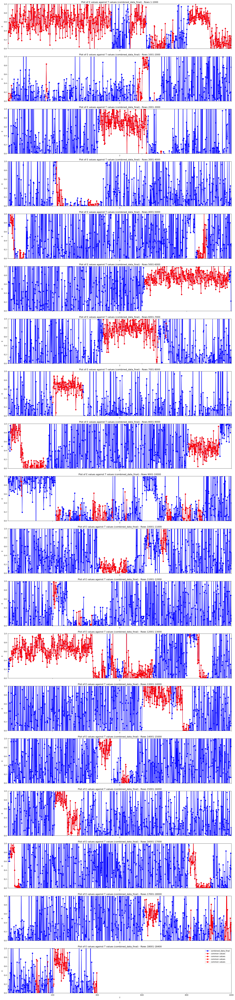

In [8]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the paths to the files
final_file_path = os.path.join(output_directory, 'combined_data_final_with_indicator.txt')
filtered_file_path = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')

# Read the data from the files
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data_final = np.loadtxt(final_file_path, skiprows=1)
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data_filtered = np.loadtxt(filtered_file_path, skiprows=1)

# Extract T and E values
T_final = combined_data_final[:, 1]
E_final = combined_data_final[:, 0]

T_filtered = combined_data_filtered[:, 1]
E_filtered = combined_data_filtered[:, 0]

# Set the number of points per plot
points_per_plot = 1000

# Calculate the number of plots needed for combined_data_final
num_plots_final = int(np.ceil(len(T_final) / points_per_plot))

# Set the figure width to be wider
# Plotting with Matplotlib — labels and titles improve readability
fig, axes = plt.subplots(num_plots_final, 1, figsize=(18, 4 * num_plots_final), sharex=True)

# Plot combined_data_final
for i in range(num_plots_final):
    start_idx = i * points_per_plot
    end_idx = min((i + 1) * points_per_plot, len(T_final))
    
    # Plot only the relevant range of T values
    axes[i].plot(np.arange(1, end_idx - start_idx + 1), E_final[start_idx:end_idx], marker='o', linestyle='-', color='blue', label='combined_data_final')

    # Highlight values in red for which there exist the same values of T in both files
    common_T_values = np.intersect1d(T_final[start_idx:end_idx], T_filtered)
    common_indices_final = np.isin(T_final[start_idx:end_idx], common_T_values)
    
    # Identify segments of consecutive red points
    red_segments = np.split(np.arange(len(common_indices_final))[common_indices_final], np.where(np.diff(np.where(common_indices_final)[0]) > 1)[0] + 1)

    # Remove lines between red dots if surrounded by only blue dots
    for segment in red_segments:
        if len(segment) > 2:
            axes[i].plot(np.arange(1, end_idx - start_idx + 1)[segment], E_final[start_idx:end_idx][segment], marker='o', linestyle='-', color='red', label='common values')

    # Set labels and title for each plot
    axes[i].set_xlabel('T')
    axes[i].set_ylabel('E')
    axes[i].set_title(f'Plot of E values against T values (combined_data_final) - Rows {start_idx + 1}-{end_idx}')

    # Set y-axis limits to [0, 1]
    axes[i].set_ylim(0, 1)

    # Set x-axis limits consistently for all subplots
    axes[i].set_xlim(1, points_per_plot)

    # Show legend for the last plot
    if i == num_plots_final - 1:
        axes[i].legend()

# Adjust layout to prevent overlapping of titles
# Plotting with Matplotlib — labels and titles improve readability
plt.tight_layout()

# Show the plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### HMM Fitting & State Decoding

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



States: 1, BIC: 4786.909971279656, AIC: 4774.258874665333
States: 2, BIC: 1853.2316922627151, AIC: 1808.9528541125853
States: 3, BIC: -194.39636565677756, AIC: -282.95404195703713
States: 4, BIC: -611.1969429726527, AIC: -756.6845540373648
States: 5, BIC: -726.7739597913435, AIC: -941.842602234831


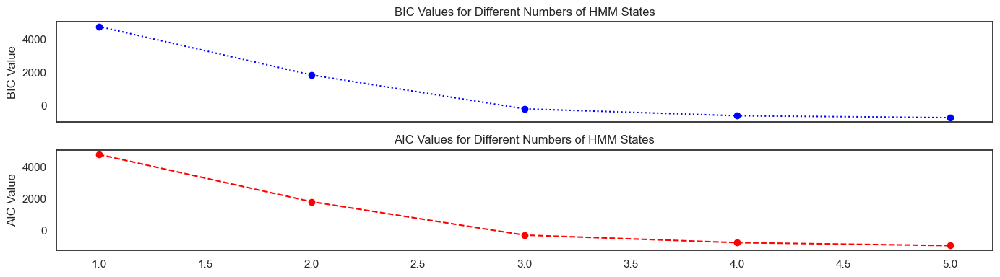

In [23]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
# Fit HMM / decode hidden states; check n_components and convergence params
from hmmlearn import hmm
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import os

# Define the path to the file
input_file = os.path.join(output_directory, 'combined_data_filtered_with_indicator.txt')

# Load the data from the file
# Load tabular data from text/CSV — ensure delimiter matches your files
combined_data = np.loadtxt(input_file, skiprows=1)

# Extract E and T columns from the filtered data
E_values = combined_data[:, 0].reshape(-1, 1)  # Assuming E is in the first column

# Set the maximum number of states you want to evaluate
max_states = 5

# Initialize arrays to store BIC, AIC, and cross-validation scores
bic_values = np.zeros(max_states)
aic_values = np.zeros(max_states)


# Evaluate models with different numbers of states
for n_states in range(1, max_states + 1):
# Fit HMM / decode hidden states; check n_components and convergence params
    model = hmm.GaussianHMM(n_components=n_states, covariance_type="full", n_iter=2000)
    
    # BIC and AIC evaluation
    model.fit(E_values)
    bic_values[n_states - 1] = model.bic(E_values)
    aic_values[n_states - 1] = model.aic(E_values)
    
    
    # Print BIC, AIC, and cross-validation scores for each state
    print(f'States: {n_states}, BIC: {bic_values[n_states - 1]}, AIC: {aic_values[n_states - 1]}')

# Find the optimal number of states based on BIC, AIC, and cross-validation
optimal_num_states_bic = np.argmin(bic_values) + 1
optimal_num_states_aic = np.argmin(aic_values) + 1

# Plot BIC, AIC, and cross-validation scores on separate panels
# Plotting with Matplotlib — labels and titles improve readability
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 4), sharex=True)

ax1.plot(range(1, max_states + 1), bic_values, marker='o', linestyle=':', color='blue', label='BIC')
ax1.set_ylabel('BIC Value')
# Fit HMM / decode hidden states; check n_components and convergence params
ax1.set_title('BIC Values for Different Numbers of HMM States')

ax2.plot(range(1, max_states + 1), aic_values, marker='o', linestyle='--', color='red', label='AIC')
ax2.set_ylabel('AIC Value')
# Fit HMM / decode hidden states; check n_components and convergence params
ax2.set_title('AIC Values for Different Numbers of HMM States')

# Plotting with Matplotlib — labels and titles improve readability
plt.tight_layout()
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### HMM Fitting & State Decoding

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



State 1 - Mean E Value: 0.7560254850093019
State 2 - Mean E Value: 0.5086904050194234
State 3 - Mean E Value: 0.055228764640907986


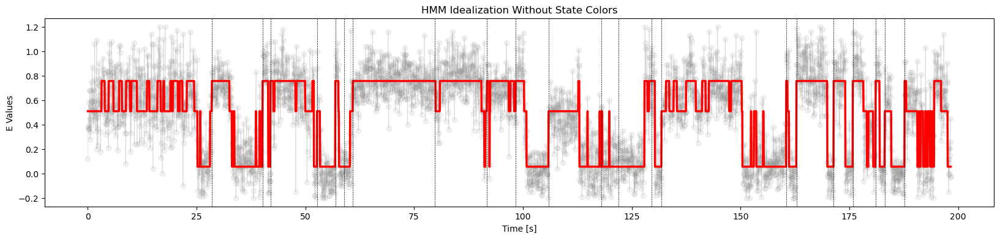

In [10]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
# 🔧 USER INPUT REQUIRED below — review and edit these assignments if needed:
#   n_components=num_states,
import numpy as np
# Fit HMM / decode hidden states; check n_components and convergence params
from hmmlearn import hmm
import matplotlib.pyplot as plt
import os

# Define the path to the input and output files
input_file = os.path.join(output_directory, 'combined_data_modified_with_indicator.txt')
# Fit HMM / decode hidden states; check n_components and convergence params
output_file_path = os.path.join(output_directory, 'HMManalysisV2.txt')

# Load the data from the input file
# Load tabular data from text/CSV — ensure delimiter matches your files
modified_data = np.loadtxt(input_file, skiprows=1)

# Extract E and T columns from the modified data
E_values = modified_data[:, 0].reshape(-1, 1)
T_values = modified_data[:, 1].reshape(-1, 1) * 0.05  # Transform T values
I_values = modified_data[:, 2]

# Fit HMM / decode hidden states; check n_components and convergence params
# Set the number of states in the HMM
num_states = 3

# Fit HMM / decode hidden states; check n_components and convergence params
# Train the HMM model with more iterations
# Fit HMM / decode hidden states; check n_components and convergence params
model = hmm.GaussianHMM(
    n_components=num_states,
    covariance_type="full",
    n_iter=100000,
    tol=1e-4,
    params='stmc',
    init_params='stmc',
    algorithm='viterbi'
)

model.fit(E_values)

# Sort states based on mean values in descending order
sorted_states = np.argsort(model.means_[:, 0])[::-1]

# Print the mean E values for each state in sorted order
for rank, state_index in enumerate(sorted_states):
    state_mean = model.means_[state_index][0]
    state_std = np.sqrt(model.covars_[state_index][0][0])
    print(f'State {rank + 1} - Mean E Value: {state_mean}')

# Get the most likely state for each data point using predict
most_likely_states = model.predict(E_values)

# Initialize an array to store the idealized trace
idealized_trace = np.zeros_like(E_values)

# Populate the idealized trace with means corresponding to the most likely state
for state_index in sorted_states:
    state_indices = np.where(most_likely_states == state_index)[0]
    idealized_trace[state_indices] = model.means_[state_index]

# Post-process the idealized trace to merge states shorter than 10 frames
min_state_duration = 1

for state in range(num_states):
    state_indices = np.where(idealized_trace == model.means_[state][0])[0]
    consecutive_diff = np.diff(state_indices)

    # Find consecutive segments shorter than min_state_duration
    short_segments = np.where(consecutive_diff > 1)[0]
    for segment in short_segments:
        start_idx = state_indices[segment] + 1
        end_idx = state_indices[segment + 1]
        if end_idx - start_idx < min_state_duration:
            idealized_trace[start_idx:end_idx + 1] = model.means_[state][0]

# Transform values to integers
transformed_E_values = np.unique(E_values, return_inverse=True)[1] + 1
transformed_idealized_trace = np.unique(idealized_trace, return_inverse=True)[1] + 1

# Fit HMM / decode hidden states; check n_components and convergence params
# Save E, T, idE, and idEmod into 'HMManalysis.txt' file
output_data = np.column_stack((E_values, T_values, idealized_trace, transformed_E_values, transformed_idealized_trace, I_values))
header = 'E T [s] idE transE idEmod I'
np.savetxt(output_file_path, output_data, header=header, fmt='%.2f %.2f %.2f %.0f %.0f %.0f', comments='')

# Fit HMM / decode hidden states; check n_components and convergence params
# Visualize the observed data, assumed HMM states, updated idealized trace with color-coded data points, and connecting black lines
# Plotting with Matplotlib — labels and titles improve readability
plt.figure(figsize=(20, 4))

# Add black lines connecting each data point
for i in range(len(T_values) - 1):
# Plotting with Matplotlib — labels and titles improve readability
    plt.plot([T_values[i], T_values[i + 1]], [E_values[i], E_values[i + 1]], color='gray', linestyle='-', linewidth=1, alpha=0.15)

# Plot data points all in the same color (e.g., gray), removing color coding by state
# Plotting with Matplotlib — labels and titles improve readability
plt.scatter(T_values, E_values, color='gray', label='Observed Data', alpha=0.1)

# Plot the updated idealized trace based on the most likely state means as a red thick line
# Plotting with Matplotlib — labels and titles improve readability
plt.plot(T_values, idealized_trace, label='Updated Idealized Trace', color='red', linestyle='-', linewidth=2.5)

# Add red vertical lines where a new number first appears in the Indicator column
unique_indicator_values, unique_indicator_indices = np.unique(I_values, return_index=True)
for idx in unique_indicator_indices[1:]:  # Skip the first index (0) as it's the starting point
# Plotting with Matplotlib — labels and titles improve readability
    plt.axvline(x=T_values[idx], color='black', linestyle='--', linewidth=0.5)

# Plotting with Matplotlib — labels and titles improve readability
plt.xlabel('Time [s]')
# Plotting with Matplotlib — labels and titles improve readability
plt.ylabel('E Values')
# Fit HMM / decode hidden states; check n_components and convergence params
# Plotting with Matplotlib — labels and titles improve readability
plt.title('HMM Idealization Without State Colors')

# Save the figure as a PDF with a unique identifier
# Plotting with Matplotlib — labels and titles improve readability
plt.rcParams['pdf.fonttype'] = '42'
pdf_filename = '67nac.pdf'
# Plotting with Matplotlib — labels and titles improve readability
plt.savefig(pdf_filename, dpi=500, bbox_inches='tight')
# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### I/O: Load Data from Disk

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [11]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
# 🔧 USER INPUT REQUIRED below — review and edit these assignments if needed:
#   time_column = np.zeros_like(movie_numbers, dtype=float)
## import numpy as np

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMManalysis.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMManalysisV2.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data = np.loadtxt(hmm_file_path, skiprows=1)

# Extract the 'idEmod', 'idE', and 'I' columns
# Fit HMM / decode hidden states; check n_components and convergence params
idEmod_values = hmm_data[:, 4]
# Fit HMM / decode hidden states; check n_components and convergence params
idE_values = hmm_data[:, 2]
# Fit HMM / decode hidden states; check n_components and convergence params
movie_numbers = hmm_data[:, 5]

# Initialize appearance time (assuming each appearance is 0.05 seconds)
appearance_duration_seconds = 0.05

# Initialize time column
time_column = np.zeros_like(movie_numbers, dtype=float)

# Iterate over each row in the data
previous_movie_number = movie_numbers[0]
# Fit HMM / decode hidden states; check n_components and convergence params
for i in range(len(hmm_data)):
    current_movie_number = movie_numbers[i]
    
    if current_movie_number != previous_movie_number:
        # Reset time when new number appears in 'I' column
        time_column[i] = 0
    else:
        # Increment time otherwise
        time_column[i] = time_column[i - 1] + appearance_duration_seconds
    
    previous_movie_number = current_movie_number

# Add the new 'A_Time' column to the data
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data_with_time = np.column_stack((hmm_data, time_column))

# Define the path to save the modified data
# Fit HMM / decode hidden states; check n_components and convergence params
output_file_path = os.path.join(output_directory, 'HMManalysisV2_with_time.txt')

# Save the modified data to a new file
# Fit HMM / decode hidden states; check n_components and convergence params
np.savetxt(output_file_path, hmm_data_with_time, delimiter='\t', header='E\tTime\tHMM\tTransE\tEmod\tI\tA_Time', comments='', fmt='%.2f')

print("New file saved successfully")

New file saved successfully


### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [12]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
from tabulate import tabulate

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMManalysis.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMManalysisV2_with_time.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data = np.loadtxt(hmm_file_path, skiprows=1)

# Fit HMM / decode hidden states; check n_components and convergence params
# Extract the 'Emod', 'HMM', and 'A_time' columns
# Fit HMM / decode hidden states; check n_components and convergence params
emod_values = hmm_data[:, 4]
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_values = hmm_data[:, 2]
# Fit HMM / decode hidden states; check n_components and convergence params
a_time_values = hmm_data[:, 6]

# Calculate the total number of rows
total_rows = len(emod_values)

# Create a modified 'A_time' column with consecutive natural numbers
modified_a_time_values = np.arange(1, total_rows + 1)

# Calculate the total time (assuming each appearance is 0.05 seconds)
total_time_seconds = (total_rows - 1) * 0.05

# Create a dictionary to store the number of occurrences of each 'Emod' state
emod_state_counts = {}

# Iterate through each 'Emod' state and count the occurrences
for emod_state in np.unique(emod_values):
    emod_state_counts[emod_state] = np.sum(emod_values == emod_state)

# Calculate the percentage of each 'Emod' state
percentage_time_in_state = {state: (count / total_rows) * 100 for state, count in emod_state_counts.items()}

# Prepare the data for the percentage of time in state table
# Fit HMM / decode hidden states; check n_components and convergence params
table_percentage_time_in_state = [["Emod state", "HMM state", "Percentage of time", "Time spent (seconds)"]]
time_spent_in_state_seconds = {state: (time / 100) * total_time_seconds for state, time in percentage_time_in_state.items()}
# Fit HMM / decode hidden states; check n_components and convergence params
table_percentage_time_in_state.extend([(state, hmm_values[np.where(emod_values == state)[0]][0], percentage, time_spent_in_state_seconds[state]) for state, percentage in percentage_time_in_state.items()])

# Print the percentage of time spent in each 'Emod' state and time spent
# Fit HMM / decode hidden states; check n_components and convergence params
print("\nPercentage of time spent in each HMM state and time spent:")
print(tabulate(table_percentage_time_in_state, headers="firstrow", tablefmt="grid"))

# Print the total time
print("\nTotal time (seconds):", total_time_seconds)

# Calculate transitions (changes) in 'Emod' values
emod_transitions_indices = np.where(np.diff(emod_values) != 0)[0]  # Find indices where 'Emod' changes

# Print the total number of transitions
total_transitions = len(emod_transitions_indices)
print("\nTotal number of transitions:", total_transitions)


Percentage of time spent in each HMM state and time spent:
+--------------+-------------+----------------------+------------------------+
|   Emod state |   HMM state |   Percentage of time |   Time spent (seconds) |
+==============+=============+======================+========================+
|            1 |        0.06 |              30.4085 |                60.2848 |
+--------------+-------------+----------------------+------------------------+
|            2 |        0.51 |              24.4831 |                48.5378 |
+--------------+-------------+----------------------+------------------------+
|            3 |        0.76 |              45.1084 |                89.4274 |
+--------------+-------------+----------------------+------------------------+

Total time (seconds): 198.25

Total number of transitions: 139


### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [13]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
from tabulate import tabulate

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMManalysis.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMManalysisV2_with_time.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data = np.loadtxt(hmm_file_path, skiprows=1)

# Extract the columns
# Fit HMM / decode hidden states; check n_components and convergence params
emod_values = hmm_data[:, 4]
# Fit HMM / decode hidden states; check n_components and convergence params
a_time_values = hmm_data[:, 6]
# Fit HMM / decode hidden states; check n_components and convergence params
i_values = hmm_data[:, 5]
# Fit HMM / decode hidden states; check n_components and convergence params
t_values = hmm_data[:, 1]  # Transform T values to seconds
# Fit HMM / decode hidden states; check n_components and convergence params
e_values = hmm_data[:, 2]  #CHOOSE DATA: HEX OR KDE

# Create a new array for E-1 with previous row E values
e_minus_1_values = np.roll(e_values, 1)
e_minus_1_values[2] = np.nan  # First row will have NaN as there's no previous value

# Calculate transitions (changes) in 'Emod' values
emod_transitions_indices = np.where(np.diff(emod_values) != 0)[0]  # Find indices where 'Emod' changes

# Extract the 'Emod' values before and after each transition
transition_from_values = emod_values[emod_transitions_indices]
transition_to_values = emod_values[emod_transitions_indices + 1]

# Extract the 'A_time' and 'I' values for each transition
transition_a_time_values = a_time_values[emod_transitions_indices + 1]
transition_i_values = i_values[emod_transitions_indices + 1]

# Initialize an array to store the time since the last transition
time_since_last_transition = np.zeros_like(transition_a_time_values)

# Set the time since the last transition for the first transition (0th index)
time_since_last_transition[0] = transition_a_time_values[0]

# Iterate through transitions to calculate time since last transition
for i in range(1, len(transition_a_time_values)):
    if transition_i_values[i] != transition_i_values[i - 1]:
        # If 'I' column value changes, set time since last transition to the current A_time
        time_since_last_transition[i] = transition_a_time_values[i]
    else:
        # Otherwise, calculate time since last transition normally
        time_since_last_transition[i] = transition_a_time_values[i] - transition_a_time_values[i - 1]

# Combine the transitions with their indices
transitions_with_indices = list(zip(t_values[emod_transitions_indices + 1], emod_transitions_indices, transition_from_values, transition_to_values, transition_a_time_values, transition_i_values, time_since_last_transition, e_values[emod_transitions_indices + 1], e_minus_1_values[emod_transitions_indices + 1]))

# Sort transitions according to their occurrence in the table
sorted_transitions_with_indices = sorted(transitions_with_indices, key=lambda x: x[1])

# Prepare the data for the transitions table
table_transitions = [["T", "From state", "To state", "A_time", "I", "Time since last transition", "E", "E-1"]]
table_transitions.extend([(transition[0], transition[2], transition[3], transition[4], transition[5], transition[6], transition[7], transition[8]) for transition in sorted_transitions_with_indices])

# Print the transitions in a table format
print("Transitions and A_time for each transition:")
print(tabulate(table_transitions, headers="firstrow", tablefmt="grid"))

# Save the table as a text file with rounded time values
# Fit HMM / decode hidden states; check n_components and convergence params
output_file_path = os.path.join(output_directory, 'HMMSummary.txt')
with open(output_file_path, 'w') as f:
    for row in table_transitions:
        # Round the values in the "Time since last transition" column to two decimals
        rounded_row = [round(value, 2) if isinstance(value, float) else value for value in row]
        f.write('\t'.join(map(str, rounded_row)) + '\n')

print("Summary table saved successfully")

Transitions and A_time for each transition:
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|      T |   From state |   To state |   A_time |   I |   Time since last transition |    E |   E-1 |
+========+==============+============+==========+=====+==============================+======+=======+
|   3.2  |            2 |          3 |     3.2  |   1 |                         3.2  | 0.76 |  0.51 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   3.95 |            3 |          2 |     3.95 |   1 |                         0.75 | 0.51 |  0.76 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   4.85 |            2 |          3 |     4.85 |   1 |                         0.9  | 0.76 |  0.51 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   5.95 |            3 |          2 |

### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [14]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
from tabulate import tabulate

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMManalysis.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMMSummary.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_summary = np.loadtxt(hmm_file_path, skiprows=1)

# Remove rows with A_time values equal to 0
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_summary = hmm_summary[hmm_summary[:, 3] != 0]

# Calculate the total number of transitions (number of rows)
# Fit HMM / decode hidden states; check n_components and convergence params
total_transitions = len(hmm_summary)

# Print the updated table
# Fit HMM / decode hidden states; check n_components and convergence params
print("HMMSummary table:")
# Fit HMM / decode hidden states; check n_components and convergence params
print(tabulate(hmm_summary, headers=["T", "From state", "To state", "A_time", "I", "Time since last transition", "E", "E-1"], tablefmt="grid"))

# Print the total number of transitions
print("\nTotal number of transitions:", total_transitions)

# Save the updated table to a text file
# Fit HMM / decode hidden states; check n_components and convergence params
np.savetxt(os.path.join(output_directory, 'HMMSummary_updated.txt'), hmm_summary, header="T From_state To_state A_time I Time_since_last_transition E E-1", fmt='%.2f %.1f %.1f %.2f %.1f %.2f %.2f %.2f', comments='')

HMMSummary table:
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|      T |   From state |   To state |   A_time |   I |   Time since last transition |    E |   E-1 |
+========+==============+============+==========+=====+==============================+======+=======+
|   3.2  |            2 |          3 |     3.2  |   1 |                         3.2  | 0.76 |  0.51 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   3.95 |            3 |          2 |     3.95 |   1 |                         0.75 | 0.51 |  0.76 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   4.85 |            2 |          3 |     4.85 |   1 |                         0.9  | 0.76 |  0.51 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|   5.95 |            3 |          2 |     5.95 |   1 |         

### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [15]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
from tabulate import tabulate

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMManalysis.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMMSummary_updated.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_summary = np.loadtxt(hmm_file_path, skiprows=1)

# Remove rows with A_time values equal to 0
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_summary = hmm_summary[hmm_summary[:, 3] != 0]

# Initialize a dictionary to store the last state before the change in I column for each unique I value
last_state_before_change_dict = {}

# Get unique values from the "I" column
# Fit HMM / decode hidden states; check n_components and convergence params
unique_I_values = np.unique(hmm_summary[:, 4])

# Iterate over unique values in the "I" column
for unique_I_value in unique_I_values:
    # Find the last state before the change in I column for the current unique I value
    last_state_before_change_info = None
# Fit HMM / decode hidden states; check n_components and convergence params
    for i in range(len(hmm_summary) - 1, -1, -1):  # Iterate backwards
# Fit HMM / decode hidden states; check n_components and convergence params
        if hmm_summary[i, 4] == unique_I_value:
# Fit HMM / decode hidden states; check n_components and convergence params
            last_state_before_change_info = hmm_summary[i, [2, 0, 3, 5]]  # To state, T, A_time, Time since last transition
            break
    last_state_before_change_dict[unique_I_value] = last_state_before_change_info

# Create a list of tuples to store the data for tabulation
table_data = []
for unique_I_value, info in last_state_before_change_dict.items():
    if info is not None:
        table_data.append((info[0], unique_I_value, *info[1:]))

# Define the directory path
directory_path = output_directory

# Save the first two columns to a text file named "LastState.txt" in the specified directory
with open(directory_path + 'LastState.txt', 'w') as file:
    # Write headers
    file.write("Last state\tI\n")
    # Write data
    for row in table_data:
        file.write(f"{row[0]}\t{row[1]}\n")

# Print the last state before the change in I column for each unique I value along with additional values in tabular form
print("Last state before the change in I column for each unique I value with additional values:")
print(tabulate(table_data, headers=["Last state", "I", "T", "A_time", "Transition time"], tablefmt="grid"))

# Calculate the total number of transitions (number of rows)
# Fit HMM / decode hidden states; check n_components and convergence params
total_transitions = len(hmm_summary)

# Print the total number of transitions
print("\nTotal number of transitions:", total_transitions)

Last state before the change in I column for each unique I value with additional values:
+--------------+-----+--------+----------+-------------------+
|   Last state |   I |      T |   A_time |   Transition time |
+==============+=====+========+==========+===================+
|            2 |   1 |  28.15 |    28.15 |              2.2  |
+--------------+-----+--------+----------+-------------------+
|            1 |   2 |  39.75 |    11.25 |              0.25 |
+--------------+-----+--------+----------+-------------------+
|            1 |   3 |  41.5  |     1.3  |              1.3  |
+--------------+-----+--------+----------+-------------------+
|            1 |   4 |  52    |    10    |              0.35 |
+--------------+-----+--------+----------+-------------------+
|            1 |   5 |  53.4  |     0.7  |              0.7  |
+--------------+-----+--------+----------+-------------------+
|            1 |   6 |  57.75 |     0.85 |              0.1  |
+--------------+-----+-------

### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [16]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import numpy as np
import os
from tabulate import tabulate
import pandas as pd

# Export results to Excel for downstream analysis / sharing
def save_table_to_excel(data, headers, output_path):
# Fit HMM / decode hidden states; check n_components and convergence params
    """Save the HMM summary table to an Excel file."""
    df = pd.DataFrame(data, columns=headers)
# Export results to Excel for downstream analysis / sharing
    df.to_excel(output_path, index=False)
    print(f"\n✅ Table successfully saved as Excel: {output_path}")

# Fit HMM / decode hidden states; check n_components and convergence params
# Define the path to the HMMSummary.txt file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_file_path = os.path.join(output_directory, 'HMMSummary_updated.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMMSummary.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data = np.loadtxt(hmm_file_path, skiprows=1)

# Sort the rows based on 'From state' and 'To state' values
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data_sorted = sorted(hmm_data, key=lambda x: (x[1], x[2]))

# Calculate the total number of transitions
# Fit HMM / decode hidden states; check n_components and convergence params
total_transitions = len(hmm_data_sorted)

# Create a dictionary to count each transition type
transition_counts = {}
# Fit HMM / decode hidden states; check n_components and convergence params
for row in hmm_data_sorted:
    transition_type = f"{int(row[1])}➔{int(row[2])}"
    transition_counts[transition_type] = transition_counts.get(transition_type, 0) + 1

# Print the total number of transitions
print("Total number of transitions:", total_transitions)
print()

# Print the number of each transition type
print("Number of each transition type:")
for transition_type, count in transition_counts.items():
    print(f"{transition_type}: {count}")

# Prepare the headers for the table
headers = ["T", "From state", "To state", "A_time", "I", "Time since last transition", "E", "E-1"]

# Print the sorted table in tabulated form
# Fit HMM / decode hidden states; check n_components and convergence params
print("\nSorted HMMSummary table:")
# Fit HMM / decode hidden states; check n_components and convergence params
print(tabulate(hmm_data_sorted, headers=headers, tablefmt="grid"))

# Save the sorted table to Excel
# Fit HMM / decode hidden states; check n_components and convergence params
excel_output_path = os.path.join(output_directory, "HMMSummary_pepe.xlsx")
# Fit HMM / decode hidden states; check n_components and convergence params
# Export results to Excel for downstream analysis / sharing
save_table_to_excel(hmm_data_sorted, headers, excel_output_path)

Total number of transitions: 124

Number of each transition type:
1➔2: 22
1➔3: 2
2➔1: 31
2➔3: 28
3➔1: 7
3➔2: 34

Sorted HMMSummary table:
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|      T |   From state |   To state |   A_time |   I |   Time since last transition |    E |   E-1 |
+========+==============+============+==========+=====+==============================+======+=======+
|  25.85 |            1 |          2 |    25.85 |   1 |                         0.6  | 0.51 |  0.06 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|  28.15 |            1 |          2 |    28.15 |   1 |                         2.2  | 0.51 |  0.06 |
+--------+--------------+------------+----------+-----+------------------------------+------+-------+
|  33.5  |            1 |          2 |     5    |   2 |                         0.35 | 0.51 |  0.06 |
+--------+--------------+------------+--------

### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



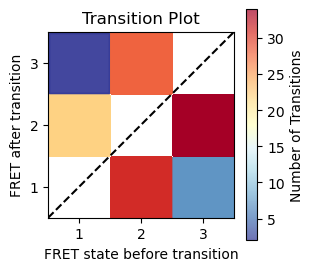

In [17]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the path to the Excel file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_excel_path = os.path.join(output_directory, 'HMMSummary_pepe.xlsx')

# Load the Excel file into a pandas DataFrame
# Fit HMM / decode hidden states; check n_components and convergence params
df = pd.read_excel(hmm_excel_path)

# Convert DataFrame to numpy array for compatibility with the rest of your code
# If your Excel columns correspond exactly to the order expected:
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data = df.values  

# Sort the rows based on 'From state' and 'To state' values
# Fit HMM / decode hidden states; check n_components and convergence params
sorted_indices = np.lexsort((hmm_data[:, 2], hmm_data[:, 1]))  # 'To state' is column index 2, 'From state' is 1
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_data_sorted = hmm_data[sorted_indices]

# Create a dictionary to count each transition type
transition_counts = {}
# Fit HMM / decode hidden states; check n_components and convergence params
for row in hmm_data_sorted:
    transition_type = f"{int(row[1])}➔{int(row[2])}"
    transition_counts[transition_type] = transition_counts.get(transition_type, 0) + 1

# Determine the number of states
# Fit HMM / decode hidden states; check n_components and convergence params
num_states = int(max(hmm_data_sorted[:, 1].max(), hmm_data_sorted[:, 2].max()))

# Prepare data for transition plot
# Fit HMM / decode hidden states; check n_components and convergence params
fret_before = hmm_data_sorted[:, 1]
# Fit HMM / decode hidden states; check n_components and convergence params
fret_after = hmm_data_sorted[:, 2]
transition_counts_list = [transition_counts.get(f"{int(before)}➔{int(after)}", 0) for before, after in zip(fret_before, fret_after)]

# Create the color map for the transition counts
min_transitions = min(transition_counts.values())
max_transitions = max(transition_counts.values())
# Plotting with Matplotlib — labels and titles improve readability
norm = plt.Normalize(min_transitions, max_transitions)
# Plotting with Matplotlib — labels and titles improve readability
cmap = plt.cm.RdYlBu_r

# Set the size of squares
square_size = 14.3

# Create the transition plot
# Plotting with Matplotlib — labels and titles improve readability
plt.figure(figsize=(num_states, num_states))
# Plotting with Matplotlib — labels and titles improve readability
plt.scatter(fret_before, fret_after, c=transition_counts_list, cmap=cmap, s=(num_states * square_size)**2, alpha=0.7, linewidth=1, norm=norm, marker='s')
# Plotting with Matplotlib — labels and titles improve readability
plt.colorbar(label='Number of Transitions')
# Plotting with Matplotlib — labels and titles improve readability
plt.xticks(np.arange(1, num_states + 1))
# Plotting with Matplotlib — labels and titles improve readability
plt.yticks(np.arange(1, num_states + 1))
# Plotting with Matplotlib — labels and titles improve readability
plt.xlim(0.5, num_states + 0.5)
# Plotting with Matplotlib — labels and titles improve readability
plt.ylim(0.5, num_states + 0.5)
# Plotting with Matplotlib — labels and titles improve readability
plt.xlabel('FRET state before transition')
# Plotting with Matplotlib — labels and titles improve readability
plt.ylabel('FRET after transition')
# Plotting with Matplotlib — labels and titles improve readability
plt.title('Transition Plot')
# Plotting with Matplotlib — labels and titles improve readability
plt.grid(False)
# Plotting with Matplotlib — labels and titles improve readability
plt.gca().set_aspect('equal', adjustable='box')
# Plotting with Matplotlib — labels and titles improve readability
plt.gca().spines['top'].set_color('black')
# Plotting with Matplotlib — labels and titles improve readability
plt.gca().spines['right'].set_color('black')
# Plotting with Matplotlib — labels and titles improve readability
plt.gca().spines['bottom'].set_color('black')
# Plotting with Matplotlib — labels and titles improve readability
plt.gca().spines['left'].set_color('black')

# Add diagonal line
# Plotting with Matplotlib — labels and titles improve readability
plt.plot([0.5, num_states + 0.5], [0.5, num_states + 0.5], color='black', linestyle='--')

# Plotting with Matplotlib — labels and titles improve readability
plt.show()

### Aggregate HMM Metrics & Summary Table

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



In [18]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
import os
import numpy as np
import pandas as pd

# Define the path to the Excel file
# Fit HMM / decode hidden states; check n_components and convergence params
hmm_excel_path = os.path.join(output_directory, 'HMMSummary_pepe.xlsx')

# Load the Excel file into a pandas DataFrame
# Fit HMM / decode hidden states; check n_components and convergence params
df = pd.read_excel(hmm_excel_path)

# Extract columns by name (assuming these column names exist in the Excel)
# If your column names are different, adjust accordingly.
columns_needed = ['From state', 'To state', 'E', 'E-1']
transition_df = df[columns_needed].copy()

# Convert to numpy array
transition_data = transition_df.values

# Sort by multiple columns: 'From state', 'To state', 'E', 'E-1'
# lexsort sorts by last key first, so order keys accordingly:
sort_indices = np.lexsort((transition_data[:, 3], transition_data[:, 2], transition_data[:, 1], transition_data[:, 0]))

# Sort the data based on the calculated indices
sorted_transition_data = transition_data[sort_indices]

# Define the path to save the modified data as txt
output_file_path = os.path.join(output_directory, 'Transition_plot.txt')

# Save the modified data to a new file with formatted output
np.savetxt(output_file_path, sorted_transition_data, fmt='%d %d %.2f %.2f', 
           header='From_State To_State FRET_after_transition FRET_before_transition', comments='')

print("Data saved to Transition_plot.txt successfully!")

Data saved to Transition_plot.txt successfully!


### Visualization: Distributions / KDE / Histograms

**What this cell does (overview):**
- Explains the step in context of the smFRET → preprocessing → HMM → visualization → summary pipeline.
- Key operations are annotated directly inside the code with comments.
- Any parameters that you likely need to change are flagged with **🔧 USER INPUT REQUIRED**.

**Inputs**: files or arrays defined earlier (see flagged variables inside the cell).  
**Outputs**: intermediate arrays, figures, or exported files as specified in comments.



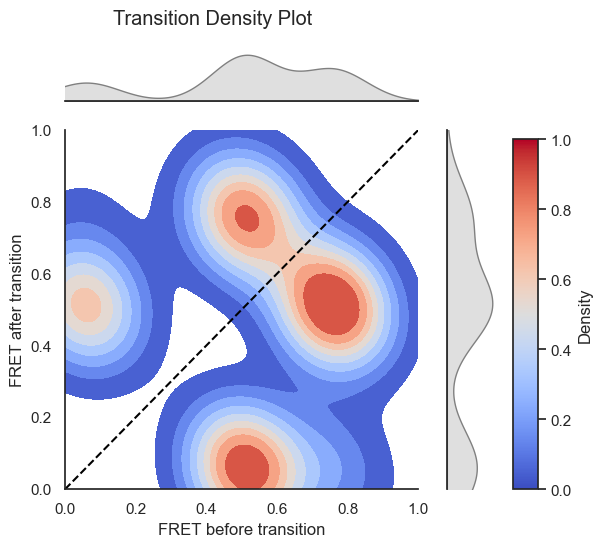

In [22]:
# Purpose: see the Markdown cell above for a high-level description.
# How it works: key steps are commented inline below.
# 🔧 USER INPUT REQUIRED below — review and edit these assignments if needed:
#   data_path = os.path.join(output_directory, 'Transition_plot.txt')
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colorbar import ColorbarBase

# Fit HMM / decode hidden states; check n_components and convergence params
#Define the path to the HMManalysis.txt file
data_path = os.path.join(output_directory, 'Transition_plot.txt')

# Fit HMM / decode hidden states; check n_components and convergence params
# Load the HMManalysis.txt file
# Load tabular data from text/CSV — ensure delimiter matches your files
data = np.loadtxt(data_path, skiprows=1)

# Extract 'FRET before transition' and 'FRET after transition' columns
fret_before_transition = data[:, 3]
fret_after_transition = data[:, 2]

# Set seaborn style
# Plotting with Seaborn — ensure it is installed in your environment
sns.set(style="white", font_scale=1)

# Create a jointplot with custom height, width, and space between plots
# Plotting with Seaborn — ensure it is installed in your environment
jp = sns.jointplot(x=fret_before_transition, y=fret_after_transition, kind='kde', cmap="coolwarm", fill=True, marginal_kws=dict(fill=True, color='gray'), gridsize=250, height=5, ratio=5, cbar=False, space=0.6)

# Set labels and title
jp.set_axis_labels('FRET before transition', 'FRET after transition')
jp.ax_joint.plot([0, 1], [0, 1], linestyle='--', color='black')  # Add diagonal line
jp.ax_joint.set_xlim(0, 1)
jp.ax_joint.set_ylim(0, 1)
jp.fig.suptitle('Transition Density Plot', x=0.4, y=1.05)

# Add color bar
cax = jp.fig.add_axes([1, 0.09, 0.05, 0.7])  # [left, bottom, width, height]
# Plotting with Matplotlib — labels and titles improve readability
cb = ColorbarBase(cax, cmap=plt.cm.coolwarm, orientation='vertical')
cb.set_label('Density')

# Show plot
# Plotting with Matplotlib — labels and titles improve readability
plt.show()